In [11]:
#import packages
from gensim.summarization import keywords
import spacy
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))
nltk.download('punkt')
from spacy.lang.en import English
nlp = English()
nlp.max_length = 20000000
import lyricsgenius
import pandas as pd
from textblob import TextBlob

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/casvriens/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/casvriens/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [3]:
#define Genius API authentication
genius = lyricsgenius.Genius('UNm8Ye9KeJJeXRYN3Uou42x4FanbsxAvTvRnGC4d5wLWov6eMkSRnsEN_v9Q9EH5')

In [15]:
#import billboard hot100 dataset
dataset = pd.read_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff.csv', on_bad_lines='skip')
dataset.head()

/var/folders/lv/gc59r_tx37j4vg8bh4cz4j_r0000gn/T/ipykernel_10655/1342647328.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  dataset = pd.read_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff.csv', on_bad_lines='skip')


In [16]:
#make unique
dataset.drop_duplicates(subset='song_id', inplace = True) #remove duplicate occurrences of songs
dataset.reset_index()

,index,chart_position,chart_date,song,performer,song_id,instance,time_on_chart,consecutive_weeks,previous_week,peak_position,worst_position,chart_debut,chart_url
0,0,84,1990-05-05,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless",1.0,1.0,NaN,NaN,84.0,84.0,1990-05-05,https://www.billboard.com/charts/hot-100/1990-...
1,15,84,1973-03-17,"""Cherry Cherry"" from Hot August Night",Neil Diamond,"""Cherry Cherry"" from Hot August NightNeil Diamond",1.0,1.0,NaN,NaN,84.0,84.0,1973-03-17,https://www.billboard.com/charts/hot-100/1973-...
2,25,99,1973-10-13,"""Having A Party"" Medley",The Ovations (Featuring Louis Williams),"""Having A Party"" MedleyThe Ovations (Featuring...",1.0,1.0,NaN,NaN,99.0,99.0,1973-10-13,https://www.billboard.com/charts/hot-100/1973-...
3,34,72,1973-12-22,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",1.0,1.0,NaN,NaN,72.0,72.0,1973-12-22,https://www.billboard.com/charts/hot-100/1973-...
4,43,87,1977-03-05,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",1.0,1.0,NaN,NaN,87.0,87.0,1977-03-05,https://www.billboard.com/charts/hot-100/1977-...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29896,329842,87,2021-06-26,transparentsoul,Willow Featuring Travis Barker,transparentsoulWillow Featuring Travis Barker,1.0,1.0,NaN,NaN,87.0,87.0,2021-06-26,https://www.billboard.com/charts/hot-100/2021-...
29897,329848,37,2018-12-22,whoa (mind in awe),XXXTENTACION,whoa (mind in awe)XXXTENTACION,1.0,1.0,NaN,NaN,37.0,37.0,2018-12-22,https://www.billboard.com/charts/hot-100/2018-...
29898,329851,75,2004-04-24,whoknows,Musiq,whoknowsMusiq,1.0,1.0,NaN,NaN,75.0,75.0,2004-04-24,https://www.billboard.com/charts/hot-100/2004-...
29899,329864,75,2000-11-04,www.memory,Alan Jackson,www.memoryAlan Jackson,1.0,1.0,NaN,NaN,75.0,75.0,2000-11-04,https://www.billboard.com/charts/hot-100/2000-...


In [17]:
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_2_unique.csv')

In [4]:
def get_lyrics(title, artist):
  try:
    return genius.search_song(title, artist).lyrics
  except:
    return 'not found'

In [11]:
def get_sentiment_textblob(lyrics): 
	''' 
	Function to return sentiment score of each song
	'''
	analysis = TextBlob(lyrics) 
	return analysis.sentiment.polarity

In [9]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

def get_sentiment_vader(text):
    sid = SentimentIntensityAnalyzer()
    scores = sid.polarity_scores(text)
    return scores['compound']

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/c.vriens/nltk_data...


In [9]:
# Function to preprocess text
def preprocess(text):
    # Create Doc object
    doc = nlp(text, disable=['ner', 'parser'])
    # Generate lemmas
    lemmas = [token.lemma_ for token in doc]
    # Remove stopwords and non-alphabetic characters
    a_lemmas = [lemma for lemma in lemmas 
            if lemma.isalpha() and lemma not in stopwords]
    
    return ' '.join(a_lemmas)

In [7]:
"""Extract Keywords from text"""
def return_keywords(texts):
    xkeywords = []
    values = keywords(text=preprocess(texts),split='\n',scores=True)
    for x in values[:10]:
        xkeywords.append(x[0])
    try:
        return xkeywords 
    except:
        return "no content"

In [17]:
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter

def get_ttr(text):
    tokens = word_tokenize(text.lower())
    types = Counter(tokens)
    ttr = len(types) / len(tokens)
    return ttr


In [26]:
def type_token_ratio(text):
    tokens = word_tokenize(text.lower())
    types = Counter(tokens)
    ttr = len(types) / len(tokens)
    return ttr

In [29]:
def get_mattr(text, window_size=500):
    tokens = word_tokenize(text.lower())
    text_length = len(tokens)

    if text_length <= window_size:
        return type_token_ratio(text)

    ttr_values = []
    for i in range(text_length - window_size + 1):
        window_tokens = tokens[i:i+window_size]
        types = Counter(window_tokens)
        ttr = len(types) / window_size
        ttr_values.append(ttr)

    mattr = sum(ttr_values) / len(ttr_values)
    return mattr


In [10]:
#Use get_lyrics funcion to get lyrics for every song in dataset
lyrics = dataset.apply(lambda row: get_lyrics(row['song'], row['performer']), axis =1)
dataset['Lyrics'] = lyrics
dataset = dataset.drop(dataset[dataset['Lyrics'] == 'not found'].index) #drop rows where lyrics are not found on Genius

Searching for ""B" Girls" by Young And Restless...
Done.
Searching for ""Cherry Cherry" from Hot August Night" by Neil Diamond...
No results found for: '"Cherry Cherry" from Hot August Night Neil Diamond'
Searching for ""Having A Party" Medley" by The Ovations (Featuring Louis Williams)...
No results found for: '"Having A Party" Medley The Ovations (Featuring Louis Williams)'
Searching for ""Joy" Pt. I" by Isaac Hayes...
Done.
Searching for ""Roots" Medley" by Quincy Jones...
Done.
Searching for ""Yep!"" by Duane Eddy His Twangy Guitar And The Rebels...
No results found for: '"Yep!" Duane Eddy His Twangy Guitar And The Rebels'
Searching for "#1 Dee Jay" by Goody Goody...
Done.
Searching for "#1" by Nelly...
Done.
Searching for "#9 Dream" by John Lennon...
Done.
Searching for "#Beautiful" by Mariah Carey Featuring Miguel...
Done.
Searching for "#SELFIE" by The Chainsmokers...
Done.
Searching for "#thatPOWER" by will.i.am Featuring Justin Bieber...
Done.
Searching for "$ave Dat Money" by

In [11]:
dataset.to_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_3_lyrics.csv')

In [14]:
#Use get_sentiment_textblob to get sentiment score by TextBlob for all the song lyrics
sentiment = dataset.apply(lambda row: get_sentiment_textblob(row['Lyrics']), axis =1)
dataset['Sentiment_TextBlob'] = sentiment
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_4_sentiment.csv')

In [15]:
dataset.head()

,Unnamed: 0.1,Unnamed: 0,chart_position,chart_date,song,performer,song_id,instance,time_on_chart,consecutive_weeks,previous_week,peak_position,worst_position,chart_debut,chart_url,Lyrics,Sentiment
0,0,0,84,1990-05-05,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless",1.0,1.0,NaN,NaN,84.0,84.0,1990-05-05,https://www.billboard.com/charts/hot-100/1990-...,"4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578
1,3,34,72,1973-12-22,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",1.0,1.0,NaN,NaN,72.0,72.0,1973-12-22,https://www.billboard.com/charts/hot-100/1973-...,2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857
2,4,43,87,1977-03-05,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",1.0,1.0,NaN,NaN,87.0,87.0,1977-03-05,https://www.billboard.com/charts/hot-100/1977-...,36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977
3,6,59,88,1978-11-18,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1.0,1.0,NaN,NaN,88.0,88.0,1978-11-18,https://www.billboard.com/charts/hot-100/1978-...,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667
4,7,64,75,2001-10-20,#1,Nelly,#1Nelly,1.0,1.0,NaN,NaN,75.0,75.0,2001-10-20,https://www.billboard.com/charts/hot-100/2001-...,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873


In [18]:
#Use get_ttr to get Type-Token Ratio (TTR) for all the song lyrics
ttr = dataset.apply(lambda row: get_ttr(row['Lyrics']), axis =1)
dataset['TTR'] = ttr
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_5_ttr.csv')

In [19]:
dataset.head()

,Unnamed: 0.1,Unnamed: 0,chart_position,chart_date,song,performer,song_id,instance,time_on_chart,consecutive_weeks,previous_week,peak_position,worst_position,chart_debut,chart_url,Lyrics,Sentiment,TTR
0,0,0,84,1990-05-05,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless",1.0,1.0,NaN,NaN,84.0,84.0,1990-05-05,https://www.billboard.com/charts/hot-100/1990-...,"4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609
1,3,34,72,1973-12-22,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",1.0,1.0,NaN,NaN,72.0,72.0,1973-12-22,https://www.billboard.com/charts/hot-100/1973-...,2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305
2,4,43,87,1977-03-05,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",1.0,1.0,NaN,NaN,87.0,87.0,1977-03-05,https://www.billboard.com/charts/hot-100/1977-...,36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111
3,6,59,88,1978-11-18,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1.0,1.0,NaN,NaN,88.0,88.0,1978-11-18,https://www.billboard.com/charts/hot-100/1978-...,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269
4,7,64,75,2001-10-20,#1,Nelly,#1Nelly,1.0,1.0,NaN,NaN,75.0,75.0,2001-10-20,https://www.billboard.com/charts/hot-100/2001-...,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286


In [30]:
#Use mattr to get Moving-Average Type-Token Ratio (MATTR) for all the song lyrics
mattr = dataset.apply(lambda row: get_mattr(row['Lyrics']), axis =1)
dataset['MATTR'] = mattr
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_6_mattr.csv')

In [31]:
dataset.head()

,Unnamed: 0.1,Unnamed: 0,chart_position,chart_date,song,performer,song_id,instance,time_on_chart,consecutive_weeks,previous_week,peak_position,worst_position,chart_debut,chart_url,Lyrics,Sentiment,TTR,MATTR
0,0,0,84,1990-05-05,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless",1.0,1.0,NaN,NaN,84.0,84.0,1990-05-05,https://www.billboard.com/charts/hot-100/1990-...,"4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609,0.386116
1,3,34,72,1973-12-22,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",1.0,1.0,NaN,NaN,72.0,72.0,1973-12-22,https://www.billboard.com/charts/hot-100/1973-...,2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305,0.481121
2,4,43,87,1977-03-05,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",1.0,1.0,NaN,NaN,87.0,87.0,1977-03-05,https://www.billboard.com/charts/hot-100/1977-...,36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111,0.508481
3,6,59,88,1978-11-18,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1.0,1.0,NaN,NaN,88.0,88.0,1978-11-18,https://www.billboard.com/charts/hot-100/1978-...,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269,0.725553
4,7,64,75,2001-10-20,#1,Nelly,#1Nelly,1.0,1.0,NaN,NaN,75.0,75.0,2001-10-20,https://www.billboard.com/charts/hot-100/2001-...,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286,0.448635


In [3]:
import pandas as pd

# Duplicate the 'chart_debut' column with only the first 4 characters
dataset['Release_Date'] = dataset['chart_debut'].str[:4]

dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_7_rd.csv')

   Unnamed: 0.2  Unnamed: 0.1  Unnamed: 0  chart_position  chart_date  \
0             0             0           0              84  1990-05-05   
1             1             3          34              72  1973-12-22   
2             2             4          43              87  1977-03-05   
3             3             6          59              88  1978-11-18   
4             4             7          64              75  2001-10-20   

             song           performer                      song_id  instance  \
0       "B" Girls  Young And Restless  "B" GirlsYoung And Restless       1.0   
1     "Joy" Pt. I         Isaac Hayes       "Joy" Pt. IIsaac Hayes       1.0   
2  "Roots" Medley        Quincy Jones   "Roots" MedleyQuincy Jones       1.0   
3      #1 Dee Jay         Goody Goody        #1 Dee JayGoody Goody       1.0   
4              #1               Nelly                      #1Nelly       1.0   

   time_on_chart  ...  previous_week  peak_position  worst_position  \
0        

In [4]:
columns_to_delete = [
    "Unnamed: 0.2", "Unnamed: 0.1", "Unnamed: 0",
    "chart_position", "chart_date", "instance",
    "time_on_chart", "previous_week", "peak_position",
    "worst_position", "chart_debut", "chart_url"
]

# Drop the specified columns and update the DataFrame
dataset = dataset.drop(columns=columns_to_delete)
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_8_cleaned.csv')

In [5]:
print(dataset.head())

             song           performer                      song_id  \
0       "B" Girls  Young And Restless  "B" GirlsYoung And Restless   
1     "Joy" Pt. I         Isaac Hayes       "Joy" Pt. IIsaac Hayes   
2  "Roots" Medley        Quincy Jones   "Roots" MedleyQuincy Jones   
3      #1 Dee Jay         Goody Goody        #1 Dee JayGoody Goody   
4              #1               Nelly                      #1Nelly   

   consecutive_weeks                                             Lyrics  \
0                NaN  4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...   
1                NaN  2 Contributors12/12 Songs LyricsAAlex Turner -...   
2                NaN  36 ContributorsUlysses (Chap. 15 - Circe) Lyri...   
3                NaN  1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...   
4                NaN  22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...   

   Sentiment       TTR     MATTR Release_Date  
0  -0.058578  0.345609  0.386116         1990  
1   0.102857  0.418305  0.481121

In [6]:
# Drop the "consecutive_weeks" column and update the DataFrame
dataset = dataset.drop(columns="consecutive_weeks")

dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_8_cleaned.csv')

In [7]:
print(dataset.head())

             song           performer                      song_id  \
0       "B" Girls  Young And Restless  "B" GirlsYoung And Restless   
1     "Joy" Pt. I         Isaac Hayes       "Joy" Pt. IIsaac Hayes   
2  "Roots" Medley        Quincy Jones   "Roots" MedleyQuincy Jones   
3      #1 Dee Jay         Goody Goody        #1 Dee JayGoody Goody   
4              #1               Nelly                      #1Nelly   

                                              Lyrics  Sentiment       TTR  \
0  4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...  -0.058578  0.345609   
1  2 Contributors12/12 Songs LyricsAAlex Turner -...   0.102857  0.418305   
2  36 ContributorsUlysses (Chap. 15 - Circe) Lyri...   0.039977  0.199111   
3  1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...  -0.016667  0.719269   
4  22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...   0.024873  0.375286   

      MATTR Release_Date  
0  0.386116         1990  
1  0.481121         1973  
2  0.508481         1977  
3  0.725

In [4]:
# Rename the 'Sentiment' column to 'Sentiment_TextBlob' to make room for 'Sentiment_VADER'
dataset = dataset.rename(columns={'Sentiment': 'Sentiment_TextBlob'})

In [10]:
#Use get_sentiment_vader to get sentiment score by VADER for all the song lyrics
sentiment_v = dataset.apply(lambda row: get_sentiment_vader(row['Lyrics']), axis =1)
dataset['Sentiment_VADER'] = sentiment_v
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_9_vader.csv')

In [12]:
dataset = dataset.drop(columns="Unnamed: 0")
dataset.head()

,song,performer,song_id,Lyrics,Sentiment_TextBlob,TTR,MATTR,Release_Date,Sentiment_VADER
0,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless","4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609,0.386116,1990,0.9547
1,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305,0.481121,1973,0.6972
2,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111,0.508481,1977,1.0000
3,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269,0.725553,1978,0.8957
4,#1,Nelly,#1Nelly,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286,0.448635,2001,0.6689


In [13]:
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_9_vader.csv')

In [13]:
dataset['chart_debut'] = hot100_ff['chart_debut']
dataset.head()

,Unnamed: 0,song,performer,song_id,Lyrics,Sentiment_TextBlob,TTR,MATTR,Release_Date,Sentiment_VADER,chart_debut
0,0,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless","4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609,0.386116,1990,0.9547,1990-05-05
1,1,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305,0.481121,1973,0.6972,1973-12-22
2,2,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111,0.508481,1977,1.0000,1977-03-05
3,3,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269,0.725553,1978,0.8957,1978-11-18
4,4,#1,Nelly,#1Nelly,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286,0.448635,2001,0.6689,2001-10-20


In [14]:
dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_10_ready4plots.csv')

In [15]:
dataset = pd.read_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_10_ready4plots.csv')

In [16]:
#Set the index of the dataframe to the chart debut. This sets us up to resample dataframe based on time
dataset['chart_debut'] = pd.to_datetime(dataset['chart_debut'],infer_datetime_format=True)
dataset = dataset.sort_values(by='chart_debut')
dataset = dataset.reset_index(drop=True)
dataset = dataset.set_index('chart_debut')

In [5]:
dataset.head()
# dataset.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_11_sortedY.csv')

,Unnamed: 0.1,Unnamed: 0,song,performer,song_id,Lyrics,Sentiment_TextBlob,TTR,MATTR,Release_Date,Sentiment_VADER
chart_debut,,,,,,,,,,,
1958-08-02,18694,18694,Return To Me,Dean Martin,Return To MeDean Martin,8 ContributorsReturn To Me Lyrics[Verse 1]\nRe...,0.010000,0.431655,0.431655,1958,0.7338
1958-08-02,7939,7939,Gotta Have Rain,Eydie Gorme,Gotta Have RainEydie Gorme,12 ContributorsAugust 2021 Singles Release Cal...,-0.009863,0.378178,0.525218,1958,-0.9664
1958-08-02,105,105,(It's Been A Long Time) Pretty Baby,Gino & Gina,(It's Been A Long Time) Pretty BabyGino & Gina,1 Contributor(It’s Been A Long Time) Pretty Ba...,0.197222,0.310680,0.310680,1958,0.9959
1958-08-02,17127,17127,One Summer Night,The Danleers,One Summer NightThe Danleers,3 ContributorsOne Summer Night Lyrics[Verse 1]...,0.349206,0.345324,0.345324,1958,0.9897
1958-08-02,25802,25802,Western Movies,The Olympics,Western MoviesThe Olympics,5 ContributorsWestern Movies LyricsTo save my ...,0.018296,0.489540,0.489540,1958,0.9874


In [20]:
#Resample dataframe sentiment column by year. This arranges the mean lyric sentiment for every year
dataset_resample = dataset['Sentiment_TextBlob'].resample('Y').mean()
#dataset_resample.to_csv('/Users/c.vriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_12_RSMPLD_MATTR.csv')

Text(0.5, 0, 'Release Year')

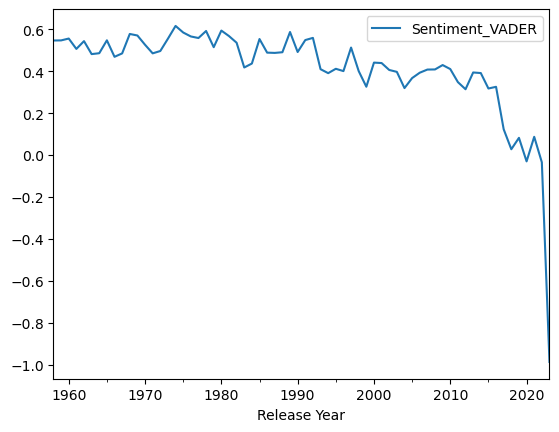

In [18]:
ax = dataset_resample.plot(label='Sentiment_VADER', legend=True)
ax.set_xlabel("Release Year")

In [21]:
#Calculate the mean percentage change of lyric sentiment
dataset_resample.pct_change().mean()

-0.07982821776690116

In [6]:
#Resample daraframe lyrics by year. Get all the lyrics for every song for each year
lyrics_resample = dataset['Lyrics'].resample('Y').sum()

In [12]:
#Use return_keywords function on lyrics_resample to get the top 20 keywords for each year
lyric_keywords = [return_keywords(x[1]) for x in lyrics_resample.iteritems()]

In [14]:
#Put lyric_keywords into a DataFrame and include lyrics_resample and dataset_resample
keywords_df = pd.DataFrame(lyric_keywords, columns = ['Keywords'])
keywords_df = keywords_df.set_index(lyrics_resample.index)
keywords_df['Lyrics'] = lyrics_resample
keywords_df.to_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/keywords.csv')

ValueError: 1 columns passed, passed data had 0 columns

In [3]:
dataset = pd.read_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_10_ready4plots.csv')
dataset.head()

,Unnamed: 0.1,Unnamed: 0,song,performer,song_id,Lyrics,Sentiment_TextBlob,TTR,MATTR,Release_Date,Sentiment_VADER,chart_debut
0,0,0,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless","4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609,0.386116,1990,0.9547,1990-05-05
1,1,1,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305,0.481121,1973,0.6972,1973-12-22
2,2,2,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111,0.508481,1977,1.0000,1977-03-05
3,3,3,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269,0.725553,1978,0.8957,1978-11-18
4,4,4,#1,Nelly,#1Nelly,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286,0.448635,2001,0.6689,2001-10-20


In [13]:
# Import necessary libraries
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Create a Gaussian Naive Bayes classifier
gnb = GaussianNB()

# Train the Naive Bayes model
gnb.fit(X_train, y_train)

# Make predictions with the Naive Bayes model
gnb_predictions = gnb.predict(X_test)

from sklearn import preprocessing

# Define the label encoder
le = preprocessing.LabelEncoder()

# Fit and transform the target values
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

# Create a XGBoost classifier
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Train the XGBoost model with the encoded labels
xgb.fit(X_train, y_train_encoded)

# Make predictions with the XGBoost model
xgb_predictions_encoded = xgb.predict(X_test)

# Decode the predictions back to the original class labels
xgb_predictions = le.inverse_transform(xgb_predictions_encoded)

# Now your predictions are in the original class labels and can be compared with y_test

# Now let's compare the models using accuracy score, confusion matrix and classification report

# Naive Bayes Metrics
print("Naive Bayes Metrics:")
print("Accuracy: ", accuracy_score(y_test, gnb_predictions))
print("Confusion Matrix: \n", confusion_matrix(y_test, gnb_predictions))
print("Classification Report: \n", classification_report(y_test, gnb_predictions))

# XGBoost Metrics
print("XGBoost Metrics:")
print("Accuracy: ", accuracy_score(y_test, xgb_predictions))
print("Confusion Matrix: \n", confusion_matrix(y_test, xgb_predictions))
print("Classification Report: \n", classification_report(y_test, xgb_predictions))


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Naive Bayes Metrics:
Accuracy:  0.03451733027785735
Confusion Matrix: 
 [[ 0  1  5 ...  0  0  0]
 [ 1  1 11 ...  0  1  0]
 [ 0  0 19 ...  0  6  0]
 ...
 [ 0  1  3 ...  1  7  2]
 [ 0  0  1 ...  0  9  1]
 [ 0  0  0 ...  0  0  0]]
Classification Report: 
               precision    recall  f1-score   support

        1958       0.00      0.00      0.00        62
        1959       0.02      0.01      0.01       115
        1960       0.07      0.12      0.09       152
        1961       0.04      0.07      0.05       133
        1962       0.09      0.02      0.03       131
        1963       0.00      0.00      0.00       136
        1964       0.00      0.00      0.00       159
        1965       0.00      0.00      0.00       153
        1966       0.04      0.09      0.05       152
        1967       0.05      0.16      0.08       159
        1968       0.03      0.22      0.05       151
        1969       0.06      0.02      0.04       162
        1970       0.00      0.00      0.00 

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvrien

In [15]:
import pandas as pd
import numpy as np

# Define the start and end years
start_year = 1958
end_year = 2022

# Create a list of year ranges
year_ranges = ["{}-{}".format(i, i+10) for i in range(start_year, end_year+1, 10)]

# Define the bins, which are the start years of each range plus the end year of the last range
bins = list(range(start_year, end_year+1, 10)) + [end_year+1]

# Use pd.cut to create a new column for the year ranges
dataset['Release_Range'] = pd.cut(dataset['Release_Date'], bins=bins, labels=year_ranges, right=False)

dataset.head()

,Unnamed: 0.1,Unnamed: 0,song,performer,song_id,Lyrics,Sentiment_TextBlob,TTR,MATTR,Release_Date,Sentiment_VADER,chart_debut,Release_Range
0,0,0,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless","4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609,0.386116,1990,0.9547,1990-05-05,1988-1998
1,1,1,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305,0.481121,1973,0.6972,1973-12-22,1968-1978
2,2,2,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111,0.508481,1977,1.0000,1977-03-05,1968-1978
3,3,3,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269,0.725553,1978,0.8957,1978-11-18,1978-1988
4,4,4,#1,Nelly,#1Nelly,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286,0.448635,2001,0.6689,2001-10-20,1998-2008


In [26]:
dataset.to_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_13_rdranges.csv')

In [23]:
# Print the number of missing values in each column
print(dataset.isna().sum())

Unnamed: 0.1          0
Unnamed: 0            0
song                  0
performer             0
song_id               0
Lyrics                0
Sentiment_TextBlob    0
TTR                   0
MATTR                 0
Release_Date          0
Sentiment_VADER       0
chart_debut           0
Release_Range         0
dtype: int64


In [22]:
dataset = dataset.fillna("2018-2028")

In [25]:
# Count the number of each unique value in the "Release_Range" column
value_counts = dataset['Release_Range'].value_counts()

# Print the counts
print(value_counts)


1958-1968    5508
1968-1978    5169
1978-1988    4041
2008-2018    3968
1988-1998    3256
1998-2008    3037
2018-2028    2947
Name: Release_Range, dtype: int64


In [18]:
dataset = pd.read_csv('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Hot Stuff_13_rdranges.csv')
dataset.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,song,performer,song_id,Lyrics,Sentiment_TextBlob,TTR,MATTR,Release_Date,Sentiment_VADER,chart_debut,Release_Range
0,0,0,0,"""B"" Girls",Young And Restless,"""B"" GirlsYoung And Restless","4 Contributors“B” Girls Lyrics[Intro]\nHey, Sl...",-0.058578,0.345609,0.386116,1990,0.9547,1990-05-05,1988-1998
1,1,1,1,"""Joy"" Pt. I",Isaac Hayes,"""Joy"" Pt. IIsaac Hayes",2 Contributors12/12 Songs LyricsAAlex Turner -...,0.102857,0.418305,0.481121,1973,0.6972,1973-12-22,1968-1978
2,2,2,2,"""Roots"" Medley",Quincy Jones,"""Roots"" MedleyQuincy Jones",36 ContributorsUlysses (Chap. 15 - Circe) Lyri...,0.039977,0.199111,0.508481,1977,1.0000,1977-03-05,1968-1978
3,3,3,3,#1 Dee Jay,Goody Goody,#1 Dee JayGoody Goody,1 ContributorLbo3d l’akhar LyricsVerse 1: (Oma...,-0.016667,0.719269,0.725553,1978,0.8957,1978-11-18,1978-1988
4,4,4,4,#1,Nelly,#1Nelly,22 Contributors#1 Lyrics[Intro]\nUh uh uh\nI j...,0.024873,0.375286,0.448635,2001,0.6689,2001-10-20,1998-2008


In [28]:
import seaborn as sn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

"""
 def plot_cm_heatmap(model, x, ytrue, ypred, labels, plottitle):
    cm = confusion_matrix(ytrue, ypred)
    plt.figure(figsize=(16,10))

    dfcm = pd.DataFrame(cm, index = [i for i in labels], columns = [i for i in labels])
    dfcm.index.name = 'True Labels'
    dfcm.columns.name = 'Predicted Labels'

    plt.title(plottitle, fontsize=30)
    ax = plt.subplot()
    label_font = {'size':'26'}  
    ax.set_xlabel( dfcm.index.name, fontdict=label_font)
    ax.set_ylabel( dfcm.columns.name, fontdict=label_font)
    ax.tick_params(axis='both', which='major', labelsize=20)
    sn.set(font_scale=1)
    sn.heatmap(dfcm, annot=True,  fmt="d", annot_kws={'size': 25})
    plt.show()
"""
def plot_cm_heatmap(model, x, ytrue, ypred, labels, plottitle):
    cm = confusion_matrix(ytrue, ypred, labels=np.arange(len(labels)))
    plt.figure(figsize=(16,10))

    dfcm = pd.DataFrame(cm, index = [i for i in labels], columns = [i for i in labels])
    dfcm.index.name = 'True Labels'
    dfcm.columns.name = 'Predicted Labels'

    plt.title(plottitle, fontsize=30)
    ax = plt.subplot()
    label_font = {'size':'26'}  
    ax.set_xlabel( dfcm.index.name, fontdict=label_font)
    ax.set_ylabel( dfcm.columns.name, fontdict=label_font)
    ax.tick_params(axis='both', which='major', labelsize=20)
    sn.set(font_scale=1)
    sn.heatmap(dfcm, annot=True,  fmt="d", annot_kws={'size': 25})
    plt.show()


In [21]:
# Baseline Model 1: x=Sentiment, y=Release_Year
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER"]]
y = dataset["Release_Date"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Open file for writing
with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Baseline Model 1, xSentiment, yRelease_Year.txt', 'w') as f:
    # Train, predict and evaluate each model
    for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Write metrics to file
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set 

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


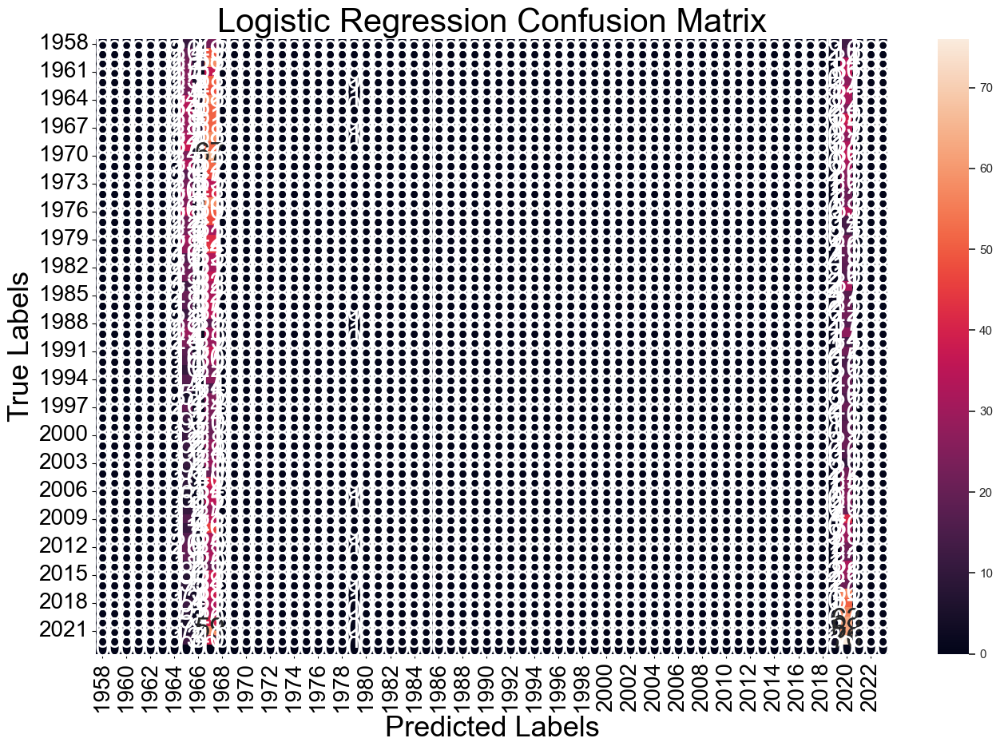

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


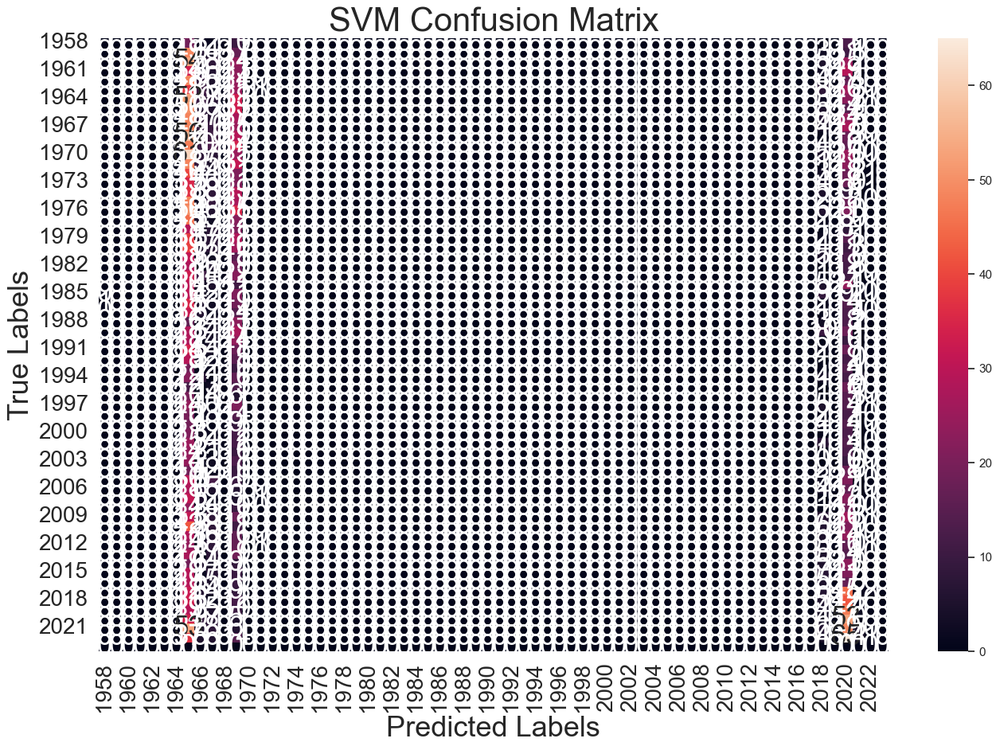

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


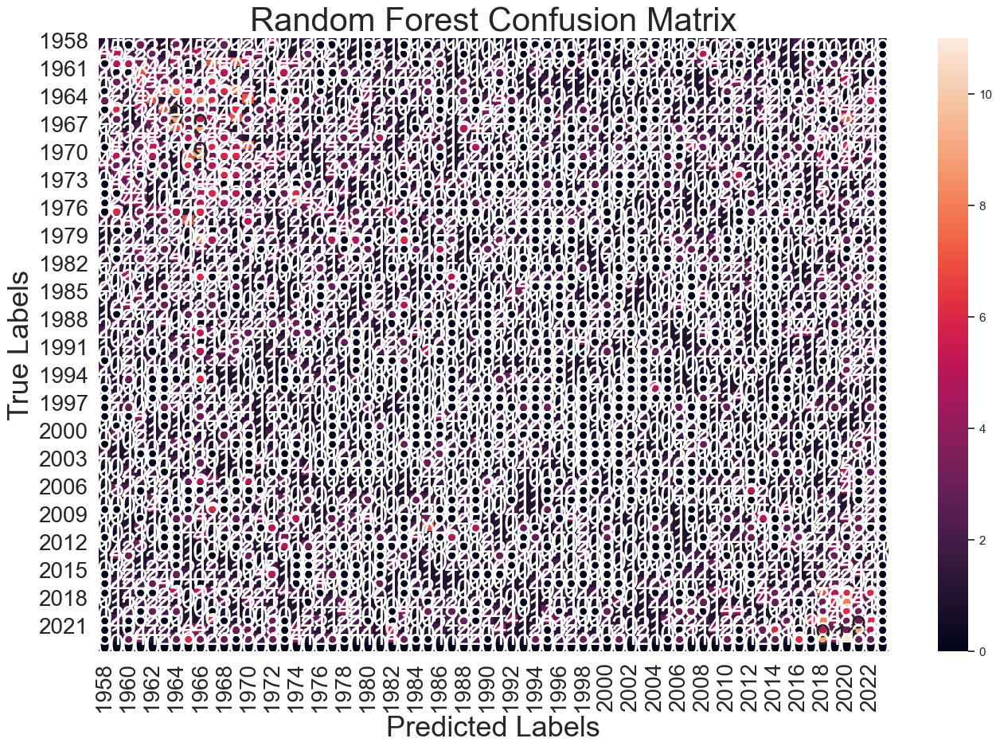

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


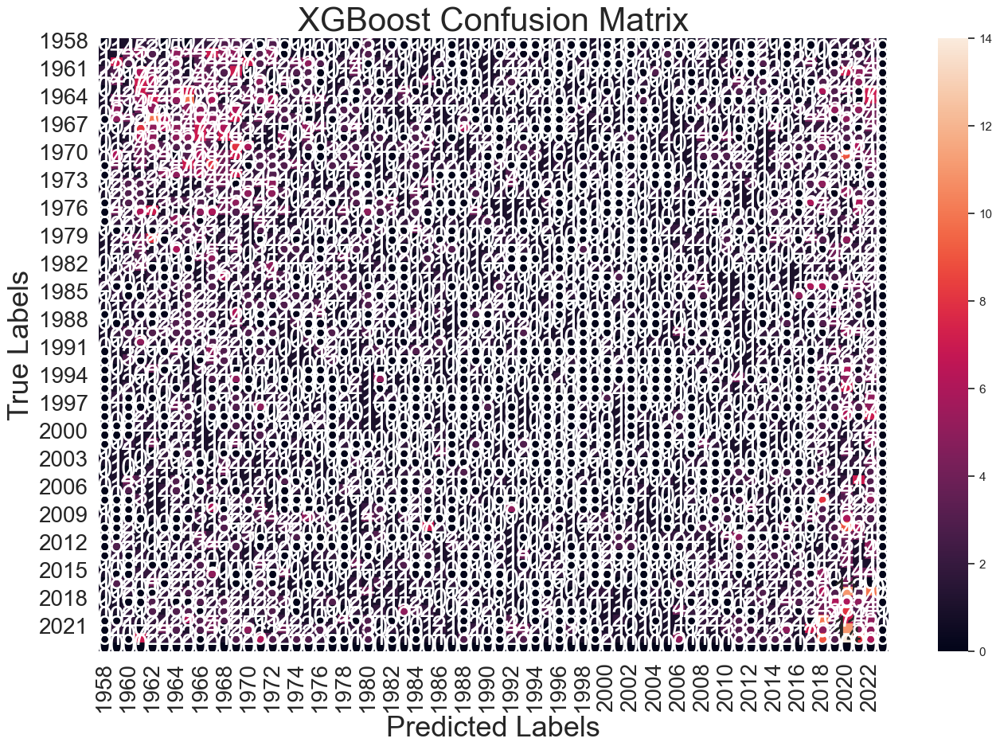

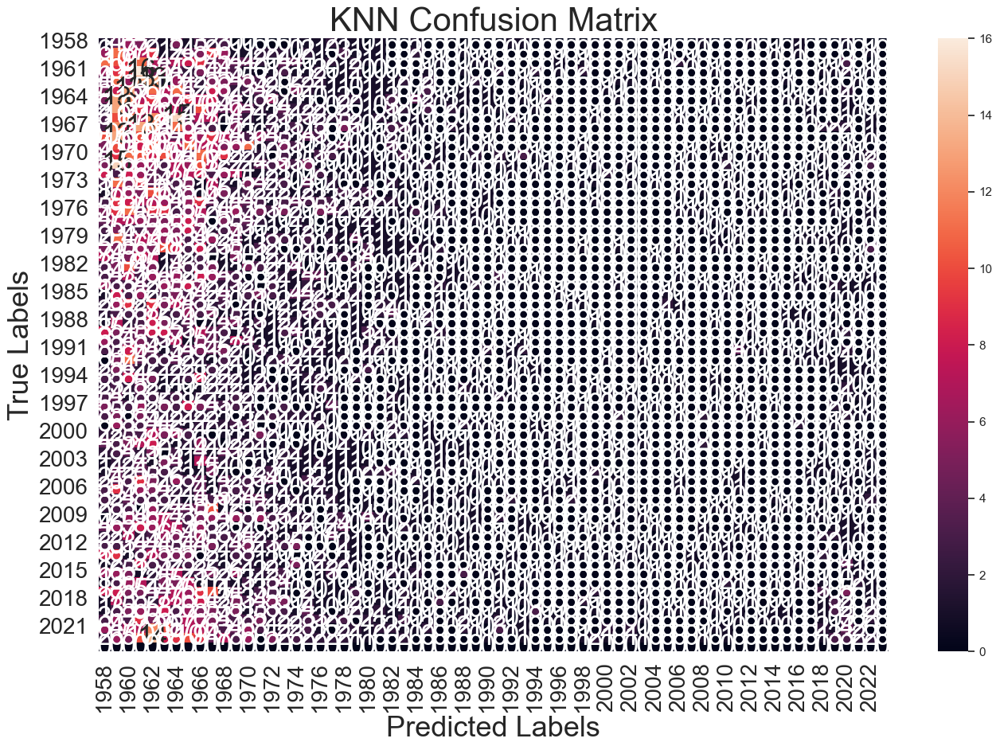

In [29]:
# Baseline Model 1: x=Sentiment, y=Release_Year
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER"]]
y = dataset["Release_Date"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Get the class labels
class_labels = label_encoder.classes_

# Train, predict and evaluate each model
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    # Plot confusion matrix
    plot_cm_heatmap(model, X_test, y_test, y_pred, class_labels, f'{name} Confusion Matrix')

    # Write metrics to file
    with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Baseline Model 1.2, xSentiment, yRelease_Year.txt', 'a') as f:
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


In [22]:
# Improved Model 1: x=Sentiment + Lexical Diversity, y=Release_Year
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER", "TTR", "MATTR"]]
y = dataset["Release_Date"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Open file for writing
with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Baseline Model 2, xSentimentLexDiv, yRelease_Year.txt', 'w') as f:
    # Train, predict and evaluate each model
    for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Write metrics to file
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set 

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


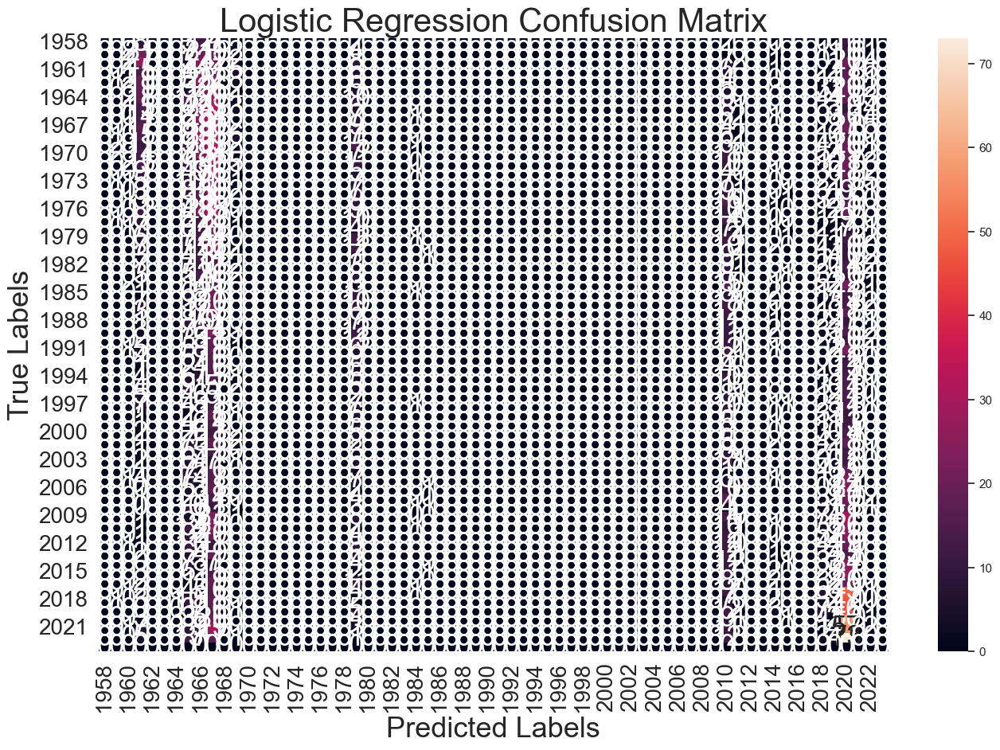

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


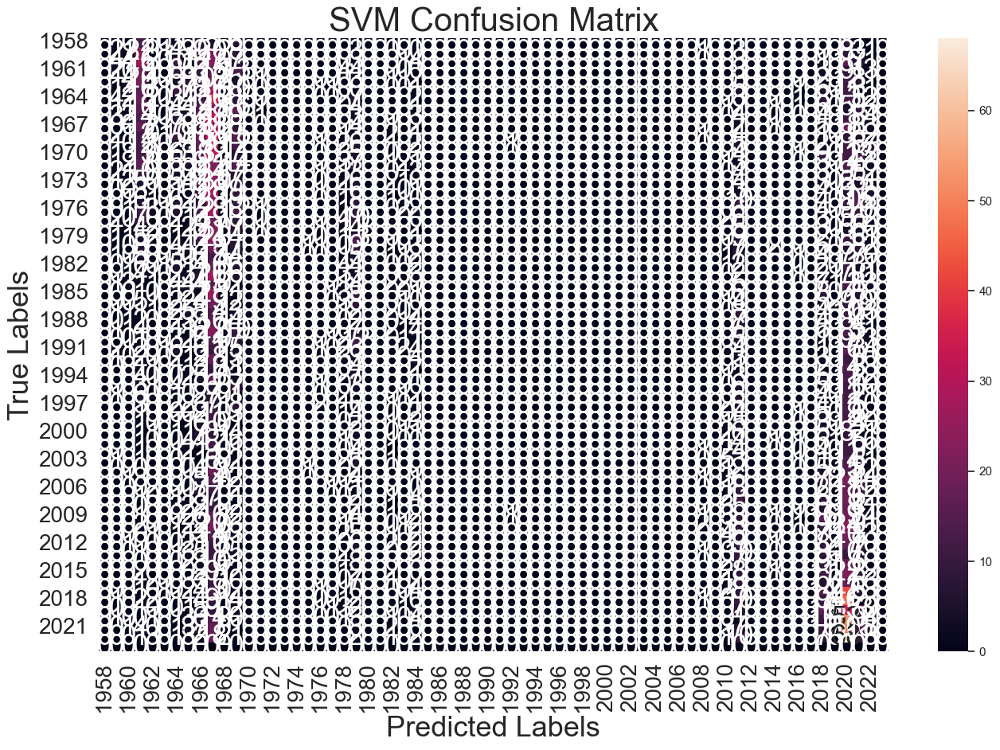

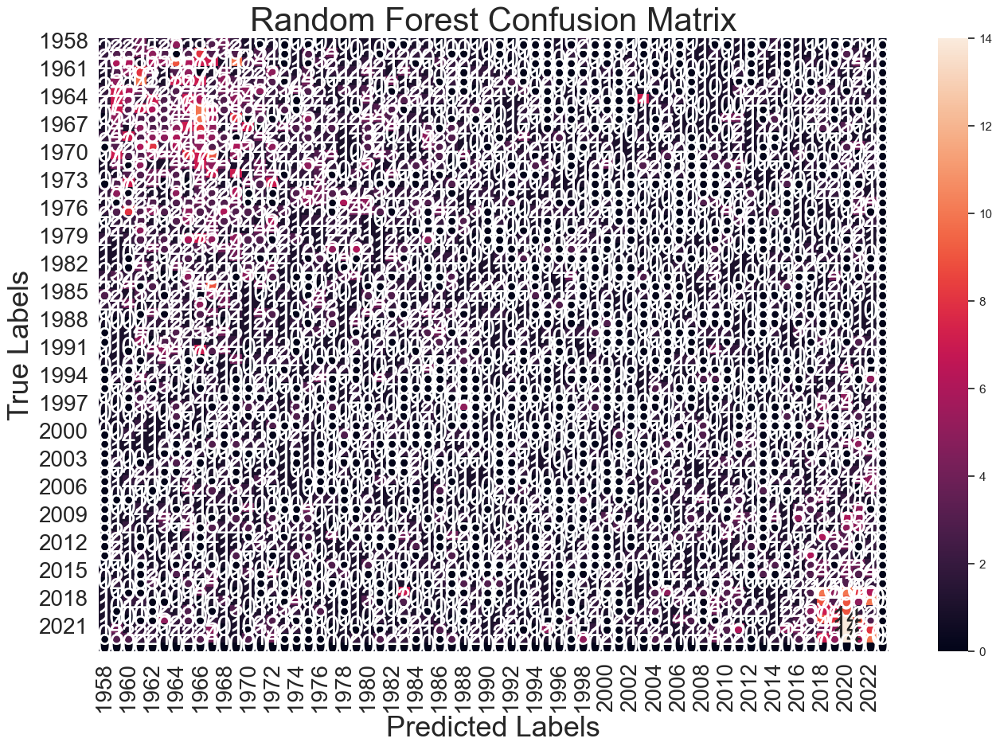

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


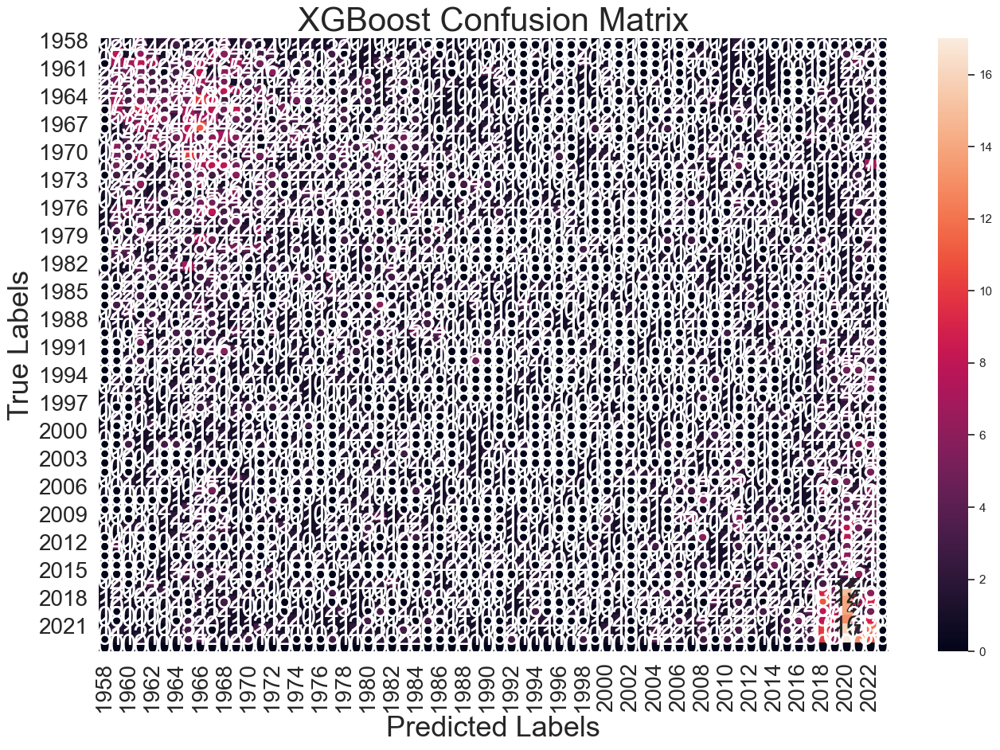

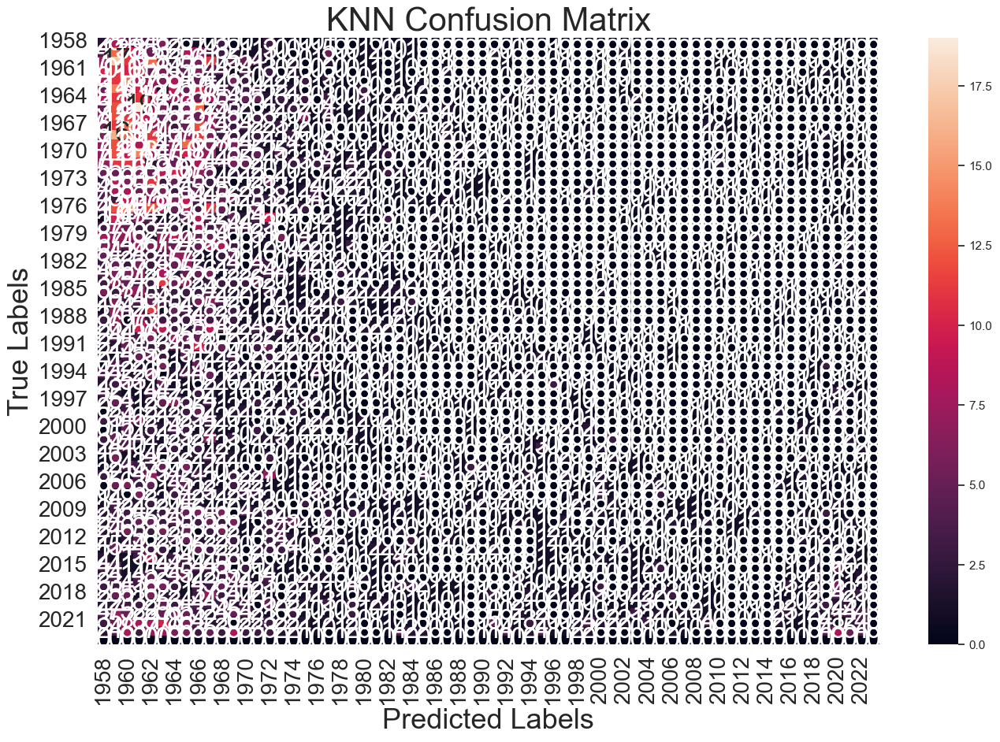

In [30]:
# Improved Model 1: x=Sentiment + Lexical Diversity, y=Release_Year
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER", "TTR", "MATTR"]]
y = dataset["Release_Date"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Get the class labels
class_labels = label_encoder.classes_

# Train, predict and evaluate each model
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    # Plot confusion matrix
    plot_cm_heatmap(model, X_test, y_test, y_pred, class_labels, f'{name} Confusion Matrix')

    # Write metrics to file
    with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Improved Model 1.2, xSentimentLexDiv, yRelease_Year.txt', 'a') as f:
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


In [23]:
# Baseline Model 2: x=Sentiment, y=Release_Decade
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER"]]
y = dataset["Release_Range"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Open file for writing
with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Baseline Model 2, xSentiment, yRelease_Decade.txt', 'w') as f:
    # Train, predict and evaluate each model
    for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Write metrics to file
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


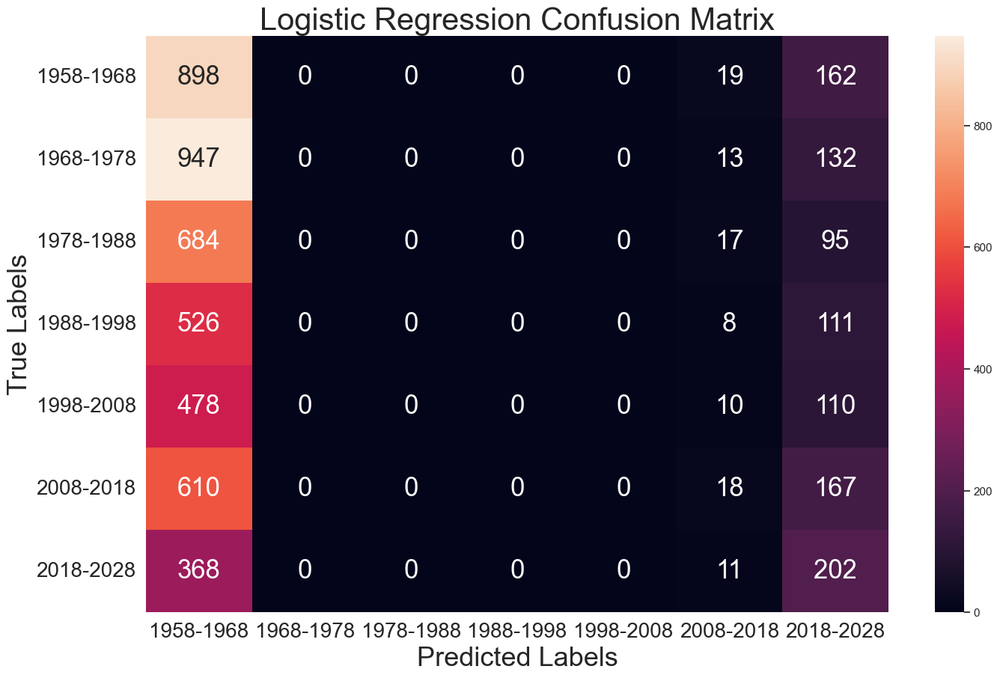

/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


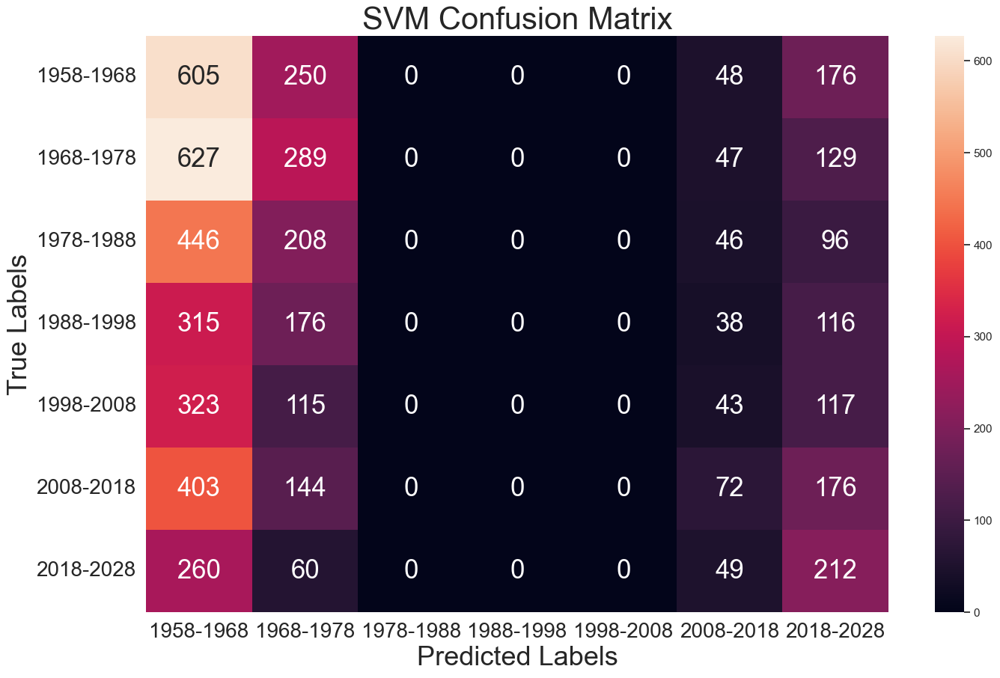

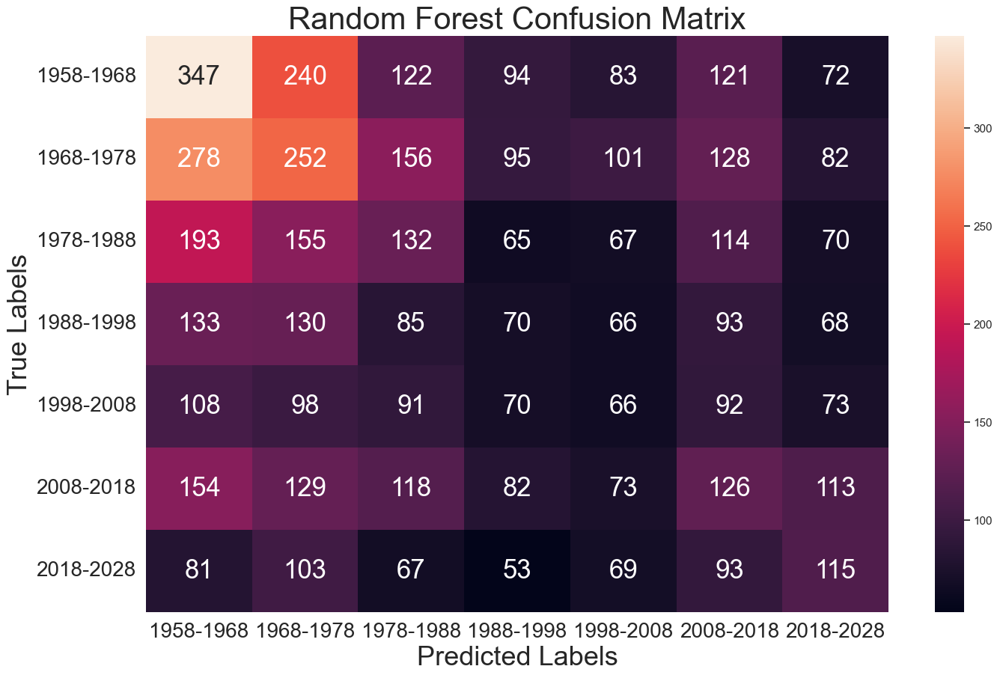

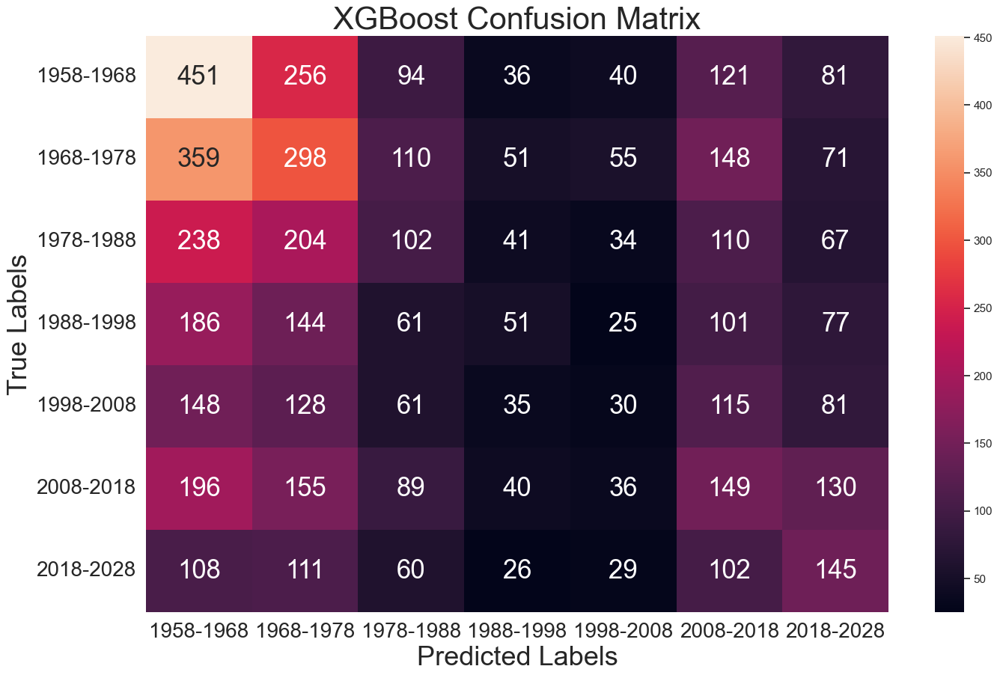

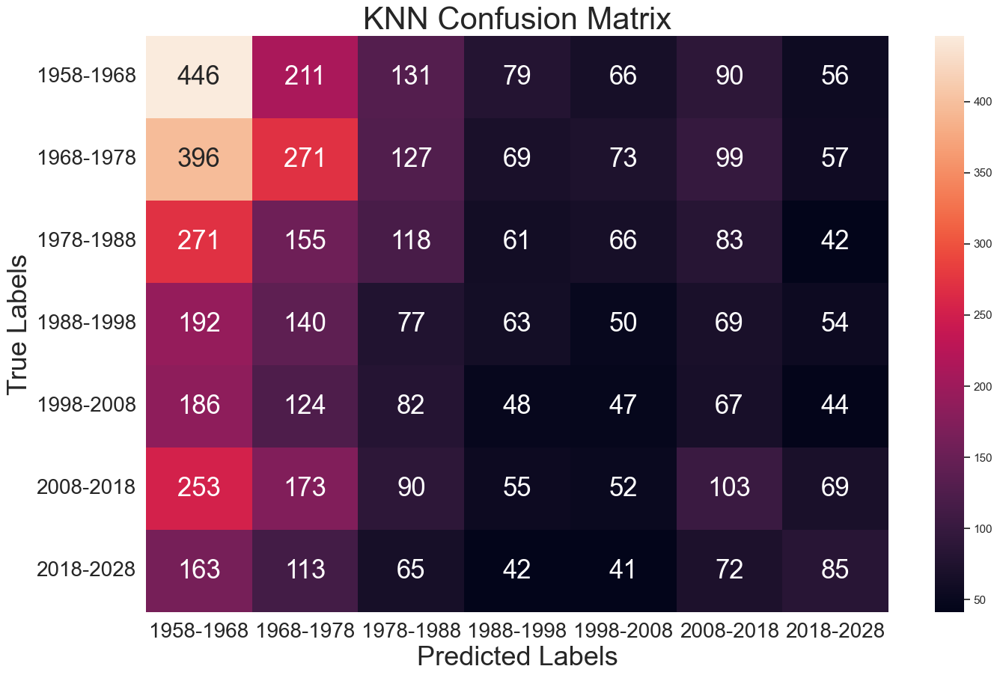

In [32]:
# Baseline Model 2: x=Sentiment, y=Release_Decade
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER"]]
y = dataset["Release_Range"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Get the class labels
class_labels = label_encoder.classes_

# Train, predict and evaluate each model
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    # Plot confusion matrix
    plot_cm_heatmap(model, X_test, y_test, y_pred, class_labels, f'{name} Confusion Matrix')

    # Write metrics to file
    with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Baseline Model 2.2, xSentiment, yRelease_Decade.txt', 'a') as f:
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


In [24]:
# Improved Model 2: x=Sentiment + Lexical Diversity, y=Release_Decade
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER", "TTR", "MATTR"]]
y = dataset["Release_Range"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Open file for writing
with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Improved Model 2, xSentimentLexDiv, yRelease_Decade.txt', 'w') as f:
    # Train, predict and evaluate each model
    for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Write metrics to file
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
/Users/casvriens/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


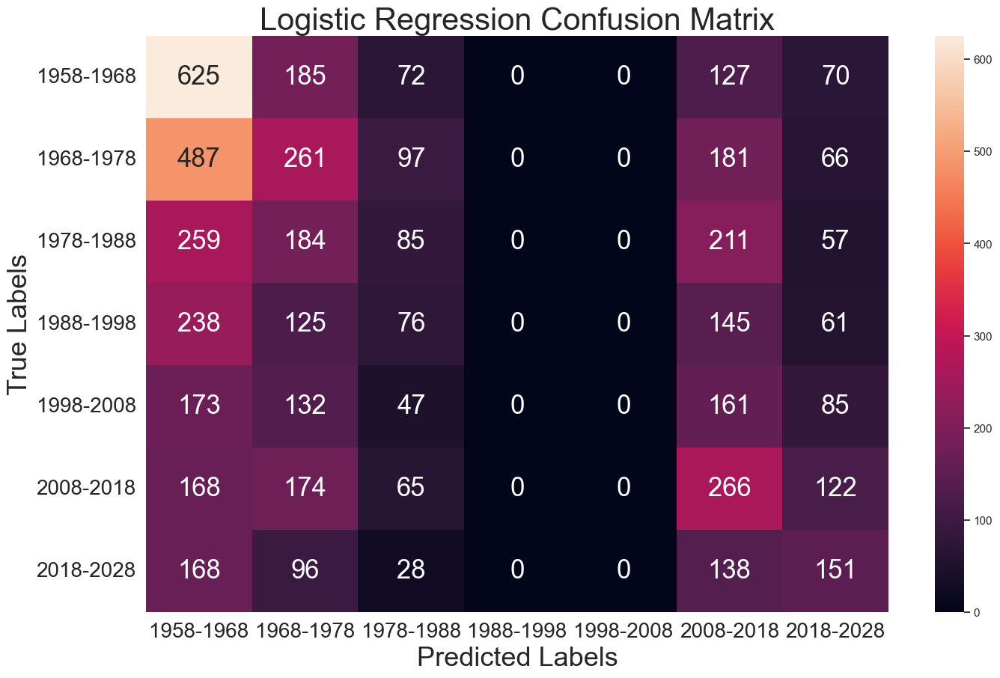

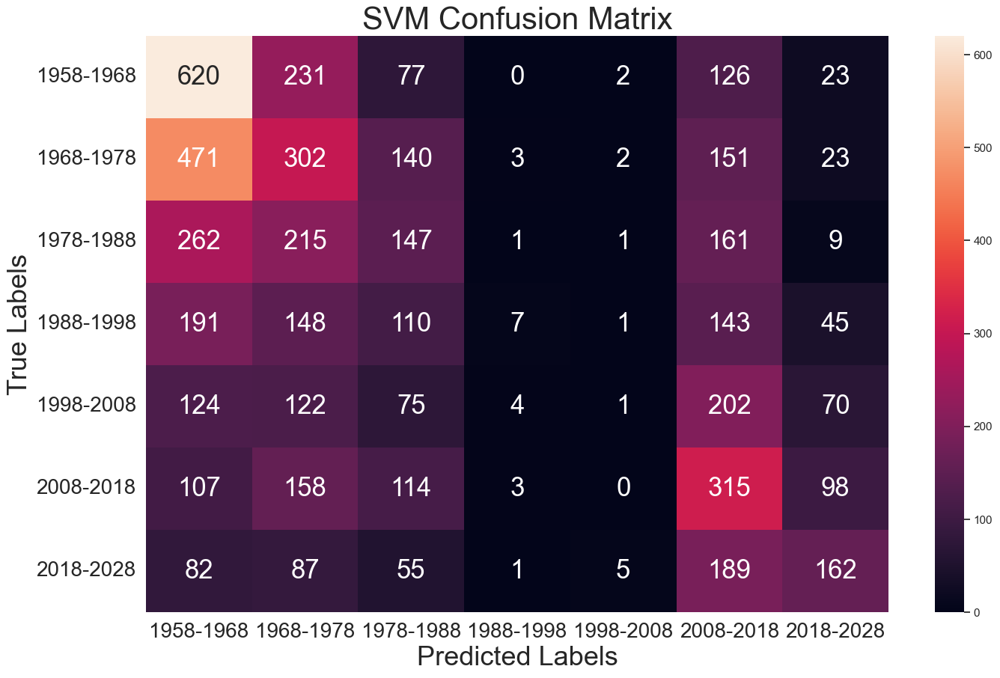

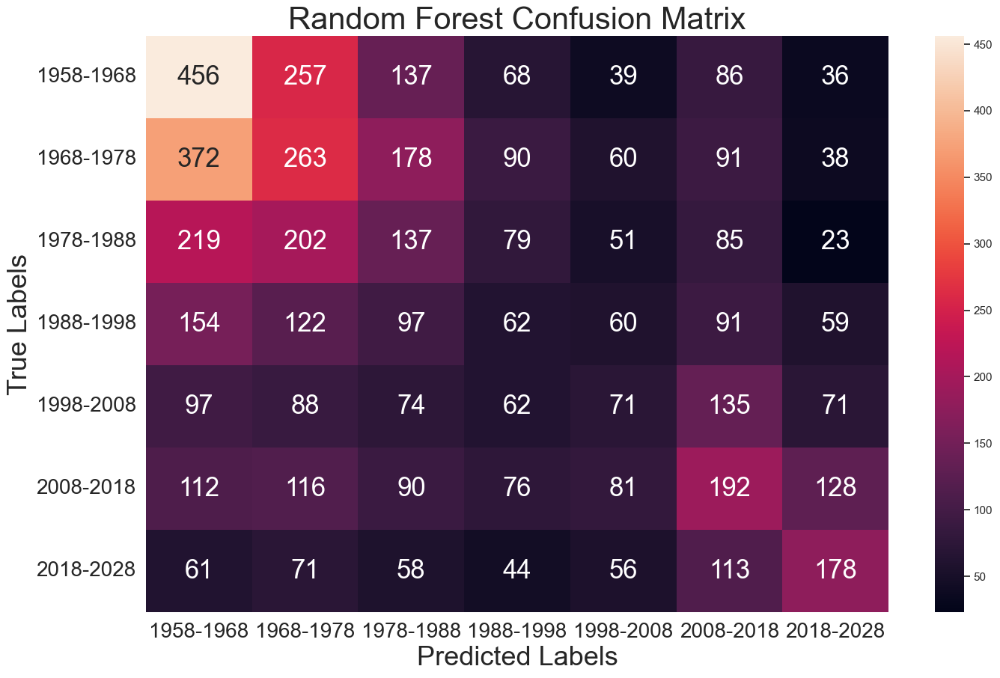

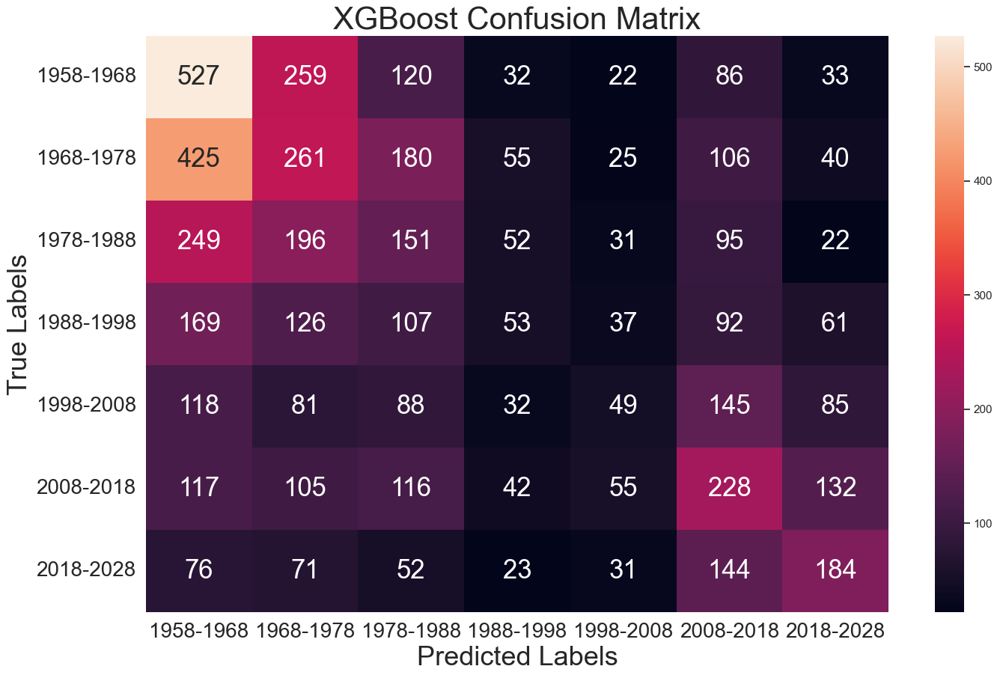

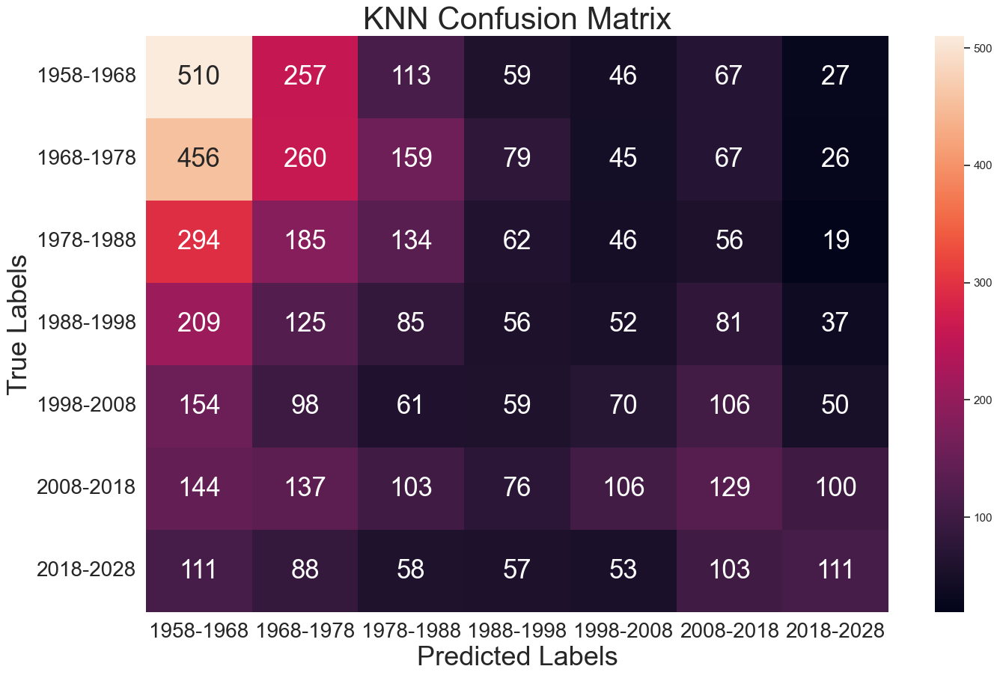

In [33]:
# Improved Model 2: x=Sentiment + Lexical Diversity, y=Release_Decade
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have your feature matrix X and target variable y
X = dataset[["Sentiment_TextBlob", "Sentiment_VADER", "TTR", "MATTR"]]
y = dataset["Release_Range"]

# Encode the string labels to integers
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Normalize the feature variables
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
models = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('SVM', SVC(kernel='rbf')),
    ('Random Forest', RandomForestClassifier(n_estimators=100)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')),
    ('KNN', KNeighborsClassifier())
]

# Get the class labels
class_labels = label_encoder.classes_

# Train, predict and evaluate each model
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    # Plot confusion matrix
    plot_cm_heatmap(model, X_test, y_test, y_pred, class_labels, f'{name} Confusion Matrix')

    # Write metrics to file
    with open('/Users/casvriens/Documents/Tilburg University/Data Science/Master/Thesis (Data Science in Action) (880502-M-18)/Code/Improved Model 2.2, xSentimentLexDiv, yRelease_Decade.txt', 'a') as f:
        f.write(f'{name}:\n Accuracy: {accuracy:.2f}\n Precision: {precision:.2f}\n Recall: {recall:.2f}\n F1 Score: {f1:.2f}\n Confusion Matrix:\n {confusion_mat}\n\n')
